## Fuel Journal Plot Generation
This notebook prepares publication-ready figures for the Fuel journal submission. Each plot meets the requested styling guidelines and saves to `plots/` as high-resolution PNG files.

In [2]:
from pathlib import Path

import joblib
from matplotlib import pyplot as plt
from matplotlib.lines import Line2D
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

try:
    from tensorflow.keras.models import load_model
except ImportError:  # pragma: no cover
    from keras.models import load_model  # type: ignore


np.random.seed(42)
FONTSIZE = 19
PLOTS_DIR = Path("plots")
PLOTS_DIR.mkdir(exist_ok=True)


BASE_RC = {
    "figure.dpi": 300,
    "savefig.dpi": 300,
    "font.size": FONTSIZE + 2,
    "axes.labelsize": FONTSIZE,
    "axes.titlesize": FONTSIZE + 2,
    "xtick.labelsize": FONTSIZE,
    "ytick.labelsize": FONTSIZE,
    "legend.fontsize": FONTSIZE,
    "lines.linewidth": 3.8,
    "axes.linewidth": 2.0,
    "grid.linewidth": 0.8,
    "grid.alpha": 0.7,
}
plt.rcParams.update(BASE_RC)
sns.set_theme(style="white", context="notebook")


def style_axes(axes):
    ax_list = axes if isinstance(axes, (list, tuple, np.ndarray)) else [axes]
    for ax in ax_list:
        ax.set_facecolor("white")
        ax.grid(True, color="#c0c0c0", linewidth=0.8)
        ax.tick_params(axis="both", width=1.8, length=9, colors="black", labelsize=FONTSIZE)
        ax.xaxis.label.set_size(FONTSIZE)
        ax.yaxis.label.set_size(FONTSIZE)
        ax.title.set_fontsize(FONTSIZE + 2)
        for spine in ax.spines.values():
            spine.set_visible(True)
            spine.set_linewidth(2.0)
            spine.set_edgecolor("black")


def style_legend(legend):
    if legend is None:
        return
    frame = legend.get_frame()
    frame.set_edgecolor("black")
    frame.set_linewidth(1.8)
    frame.set_facecolor("white")
    frame.set_alpha(1.0)
    for text in legend.get_texts():
        text.set_fontsize(FONTSIZE)


def save_plot(fig, filename):
    output_path = PLOTS_DIR / filename
    fig.savefig(output_path, format="png", bbox_inches="tight", facecolor="white")
    plt.show()
    plt.close(fig)

In [3]:
data_path = Path("data/processed/preprocessed_dataset.csv")
df = pd.read_csv(data_path)
rename_map = {
    "Time_ms": "time",
    "Pc_bar": "chamb_pressure",
    "Tc_K": "cham_temp",
    "Pinj_bar": "injection_pres",
    "rho_kgm3": "density",
    "mu_Pas": "viscosity",
    "angle_shadow_deg": "angle_shadow",
    "len_shadow_L_D": "length_shadow",
    "angle_mie_deg": "angle_mie",
    "len_mie_L_D": "length_mie",
}
df = df.rename(columns=rename_map)
FEATURES = ["time", "chamb_pressure", "cham_temp", "injection_pres", "density", "viscosity"]
TARGETS = ["angle_mie", "length_mie", "angle_shadow", "length_shadow"]
FEATURE_LABELS = {
    "time": "Time (ms)",
    "chamb_pressure": "Chamber Pressure (bar)",
    "cham_temp": "Chamber Temperature (K)",
    "injection_pres": "Injection Pressure (bar)",
    "density": "Density (kg/m^3)",
    "viscosity": "Viscosity (Pa*s)",
}
TARGET_LABELS = {
    "angle_mie": "Spray Angle (Mie) [deg]",
    "length_mie": "Spray Length (Mie) [L/D]",
    "angle_shadow": "Spray Angle (Shadowgraph) [deg]",
    "length_shadow": "Spray Length (Shadowgraph) [L/D]",
}
scaler = StandardScaler()
scaled_features = pd.DataFrame(
    scaler.fit_transform(df[FEATURES]), columns=FEATURES
)
print(f"Dataset loaded: {df.shape[0]} samples, {len(FEATURES)} inputs, {len(TARGETS)} targets.")

Dataset loaded: 726 samples, 6 inputs, 4 targets.


In [4]:
from keras import losses

MODEL_ORDER = [
    ("LinearRegression", Path("models/LinearRegression_regressor.joblib")),
    ("DecisionTree", Path("models/DecisionTree_regressor.joblib")),
    ("RandomForest", Path("models/RandomForest_regressor.joblib")),
    ("SVR", Path("models/SVR_regressor.joblib")),
    ("KNN", Path("models/KNN_regressor.joblib")),
    ("GradientBoosting", Path("models/GradientBoosting_regressor.joblib")),
]
model_palette = sns.color_palette("tab10", len(MODEL_ORDER))
MODEL_COLORS = {name: color for (name, _), color in zip(MODEL_ORDER, model_palette)}
X = df[FEATURES]
y = df[TARGETS]
stratify_labels = df["run"] if "run" in df.columns else None
split_kwargs = {"test_size": 0.2, "random_state": 42}
if stratify_labels is not None:
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, stratify=stratify_labels, **split_kwargs
    )
else:
    X_train, X_test, y_train, y_test = train_test_split(X, y, **split_kwargs)

X_train = X_train.reset_index(drop=True)
X_test = X_test.reset_index(drop=True)
y_train = y_train.reset_index(drop=True)
y_test = y_test.reset_index(drop=True)

model_predictions = {}
gradient_boosting_model = None

for name, model_path in MODEL_ORDER:
    if not model_path.exists():
        print(f"Warning: {model_path} not found. Skipping {name}.")
        continue
    model = joblib.load(model_path)
    fitted_model = model.fit(X_train, y_train)
    preds = fitted_model.predict(X_test)
    preds_df = pd.DataFrame(preds, columns=TARGETS)
    model_predictions[name] = {"model": fitted_model, "predictions": preds_df}
    if name == "GradientBoosting":
        gradient_boosting_model = fitted_model

if gradient_boosting_model is None:
    raise FileNotFoundError("GradientBoosting_regressor.joblib is required for downstream plots.")

ann_model_path = Path("models/ANN_improved_regressor.h5")
ann_input_scaler_path = Path("models/ann_input_scaler.joblib")
ann_target_scaler_path = Path("models/ann_target_scaler.joblib")

if ann_model_path.exists() and ann_input_scaler_path.exists() and ann_target_scaler_path.exists():
    ann_model = load_model(ann_model_path, compile=False)
    ann_model.compile(optimizer="adam", loss=losses.MeanSquaredError())
    ann_input_scaler = joblib.load(ann_input_scaler_path)
    ann_target_scaler = joblib.load(ann_target_scaler_path)
    X_test_scaled = ann_input_scaler.transform(X_test[FEATURES].values)
    ann_pred_scaled = ann_model.predict(X_test_scaled, verbose=0)
    ann_predictions_df = pd.DataFrame(
        ann_target_scaler.inverse_transform(ann_pred_scaled),
        columns=TARGETS,
    )
else:
    raise FileNotFoundError("ANN model or scalers are missing; please ensure all ANN artifacts are present.")

ann_residuals_df = y_test[TARGETS] - ann_predictions_df
gb_predictions_df = model_predictions["GradientBoosting"]["predictions"]
angle_mie_residuals = {
    name: y_test["angle_mie"].values - info["predictions"]["angle_mie"].values
    for name, info in model_predictions.items()
}
angle_mie_pred_values = {
    name: info["predictions"]["angle_mie"].values
    for name, info in model_predictions.items()
}
sample_index = np.arange(len(y_test))

d:\GitHub Repos\spray-vision\.venv\Lib\site-packages\sklearn\base.py:442: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.6.1 when using version 1.7.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
d:\GitHub Repos\spray-vision\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


**Figure 1.1** Time-dependent variation of spray angle and penetration length for a representative experimental run using Mie and shadowgraph diagnostics.
The overlay highlights how the two sensing modalities evolve together over the sampled window.

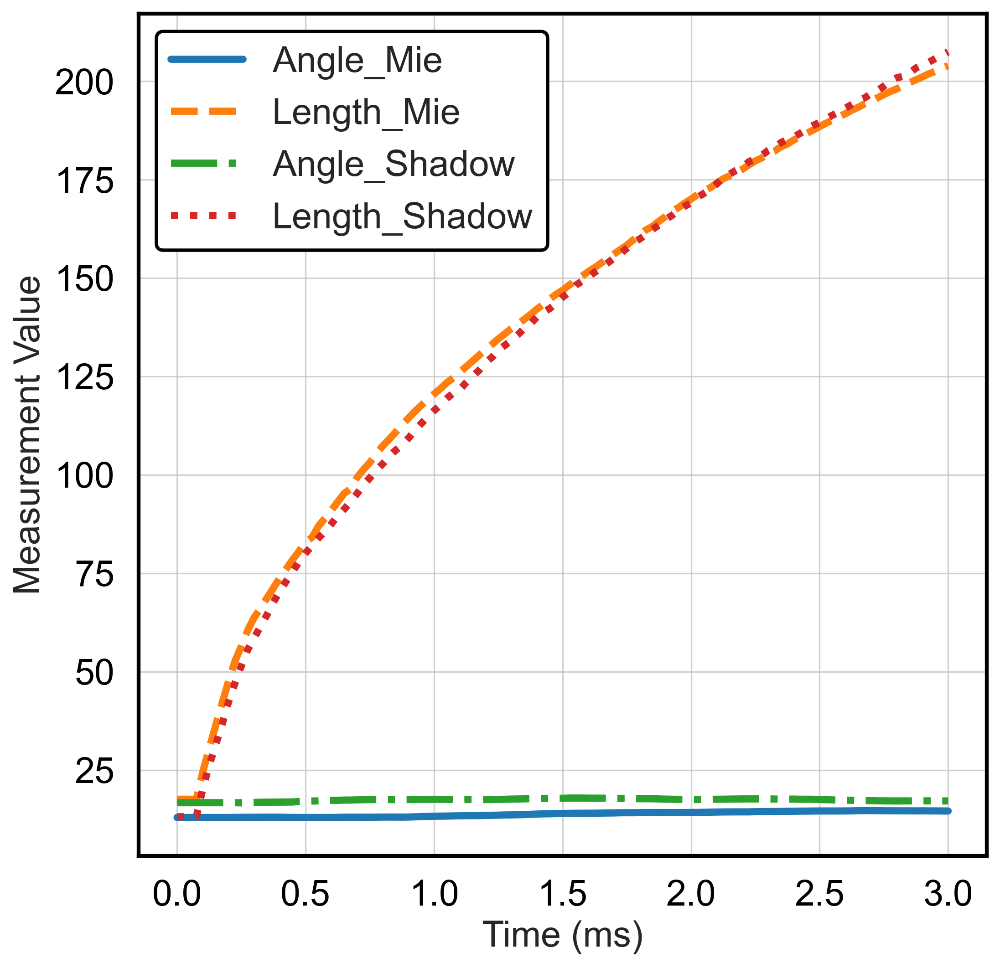

In [5]:
run_id = df["run"].iloc[0] if "run" in df.columns else None
run_trace = df[df["run"] == run_id].copy() if run_id is not None else df.iloc[:200].copy()
run_trace = run_trace.sort_values("time")
fig, ax = plt.subplots(figsize=(8, 8))
ax.plot(run_trace["time"], run_trace["angle_mie"], label="Angle_Mie", color="#1f77b4", linewidth=3.8, linestyle='-')
ax.plot(run_trace["time"], run_trace["length_mie"], label="Length_Mie", color="#ff7f0e", linewidth=3.8, linestyle='--')
ax.plot(run_trace["time"], run_trace["angle_shadow"], label="Angle_Shadow", color="#2ca02c", linewidth=3.8, linestyle='-.')
ax.plot(run_trace["time"], run_trace["length_shadow"], label="Length_Shadow", color="#d62728", linewidth=3.8, linestyle=':')
ax.set_xlabel("Time (ms)", fontsize=FONTSIZE)
ax.set_ylabel("Measurement Value", fontsize=FONTSIZE)
style_axes(ax)
legend = ax.legend(loc="upper left", frameon=True, fontsize=FONTSIZE)
style_legend(legend)
save_plot(fig, "figure_1_1_time_variation.png")

**Figure 1.2** Box plot of raw input variables before scaling to reveal their native magnitude differences.
Large spreads across features motivate the need for standardization prior to modeling.

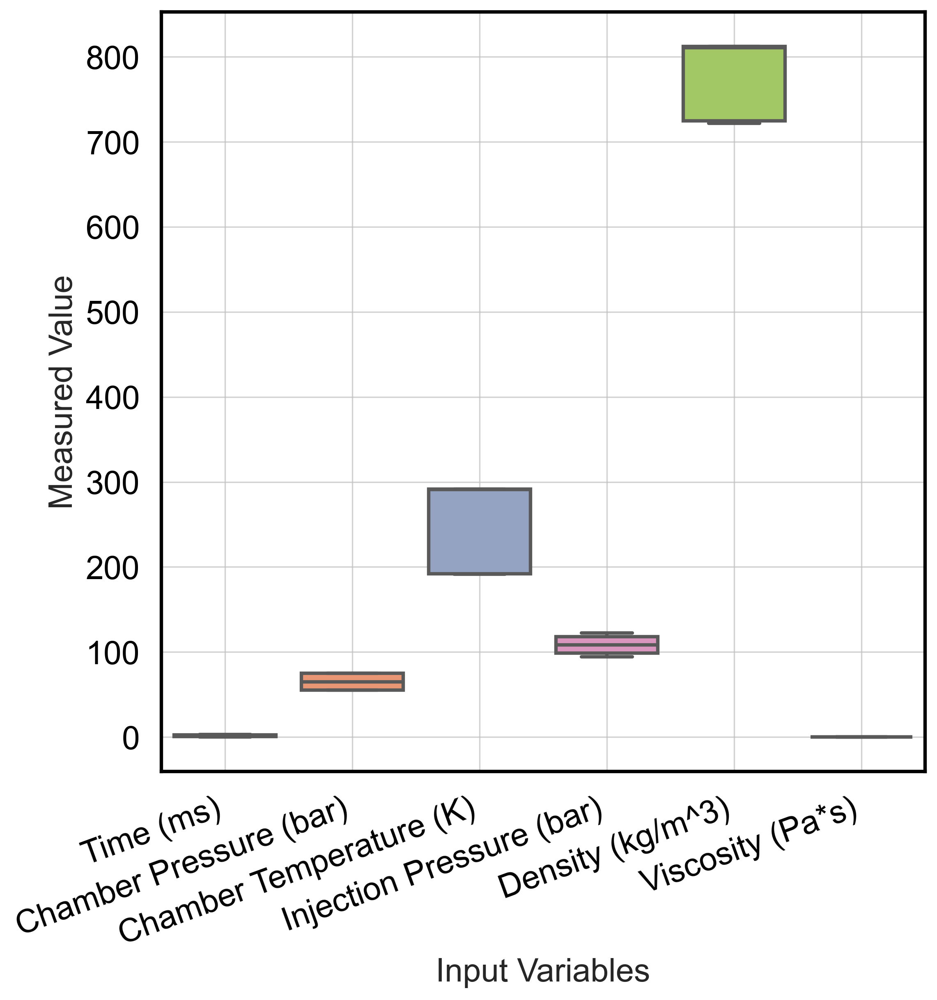

In [ ]:
fig, ax = plt.subplots(figsize=(8, 8))
palette = sns.color_palette("Set2", len(FEATURES))
sns.boxplot(data=df[FEATURES], palette=palette, ax=ax, linewidth=2.0)
ax.set_xlabel("Input Variables", fontsize=FONTSIZE)
ax.set_ylabel("Measured Value", fontsize=FONTSIZE)
ax.set_xticks(range(len(FEATURES)))
ax.set_xticklabels(
    [FEATURE_LABELS[f] for f in FEATURES], rotation=20, ha="right", fontsize=FONTSIZE
)
style_axes(ax)
save_plot(fig, "figure_1_2_inputs_before_scaling.png")

**Figure 1.3** Box plot of standardized input variables showing the effect of scaling.
All features now share the same spread, enabling fair weightings inside each model.

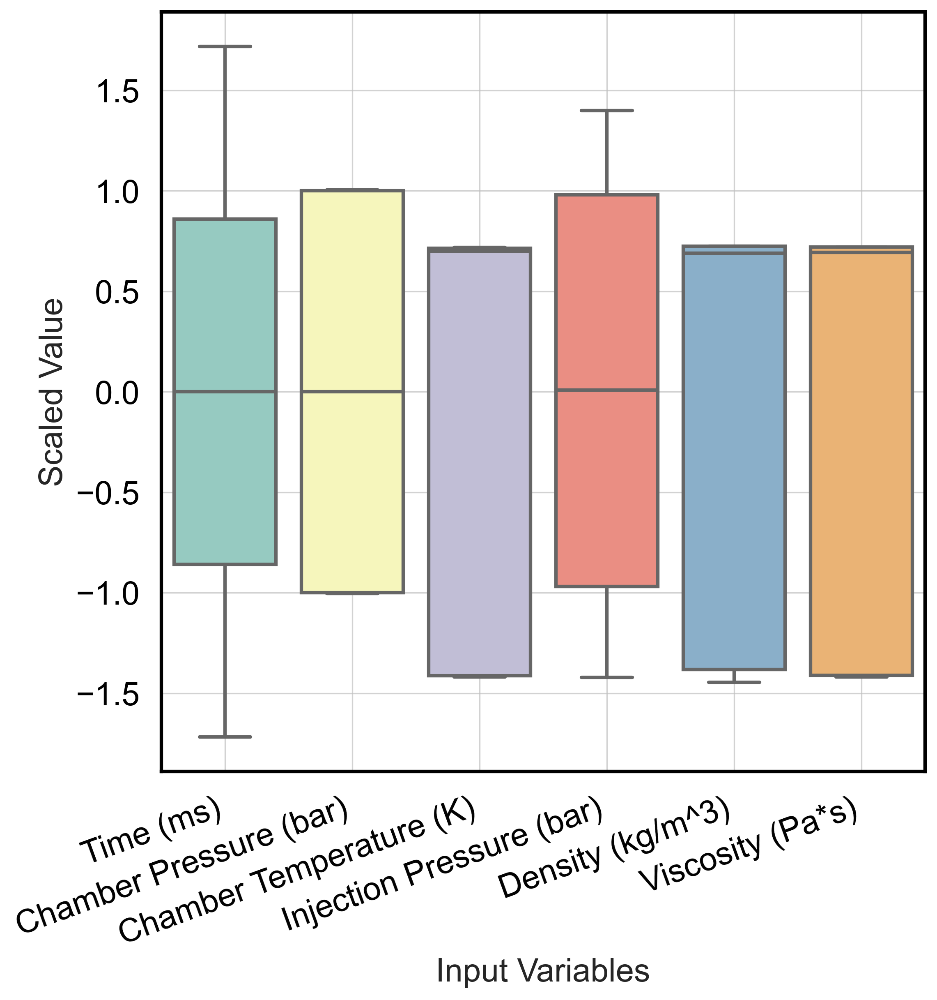

In [28]:
fig, ax = plt.subplots(figsize=(8, 8))
palette = sns.color_palette("Set3", len(FEATURES))
sns.boxplot(data=scaled_features, palette=palette, ax=ax, linewidth=2.0)
ax.set_xlabel("Input Variables", fontsize=FONTSIZE)
ax.set_ylabel("Scaled Value", fontsize=FONTSIZE)
ax.set_xticks(range(len(FEATURES)))  # Set tick positions
ax.set_xticklabels(
    [FEATURE_LABELS[f] for f in FEATURES],
    rotation=20,
    ha="right",
    fontsize=FONTSIZE,
)
style_axes(ax)
save_plot(fig, "figure_1_3_inputs_after_scaling.png")


**Figure 1.4** Correlation heatmap summarizing linear relationships among inputs and spray targets.
Warm colors indicate positive associations, while cool tones mark inverse trends.

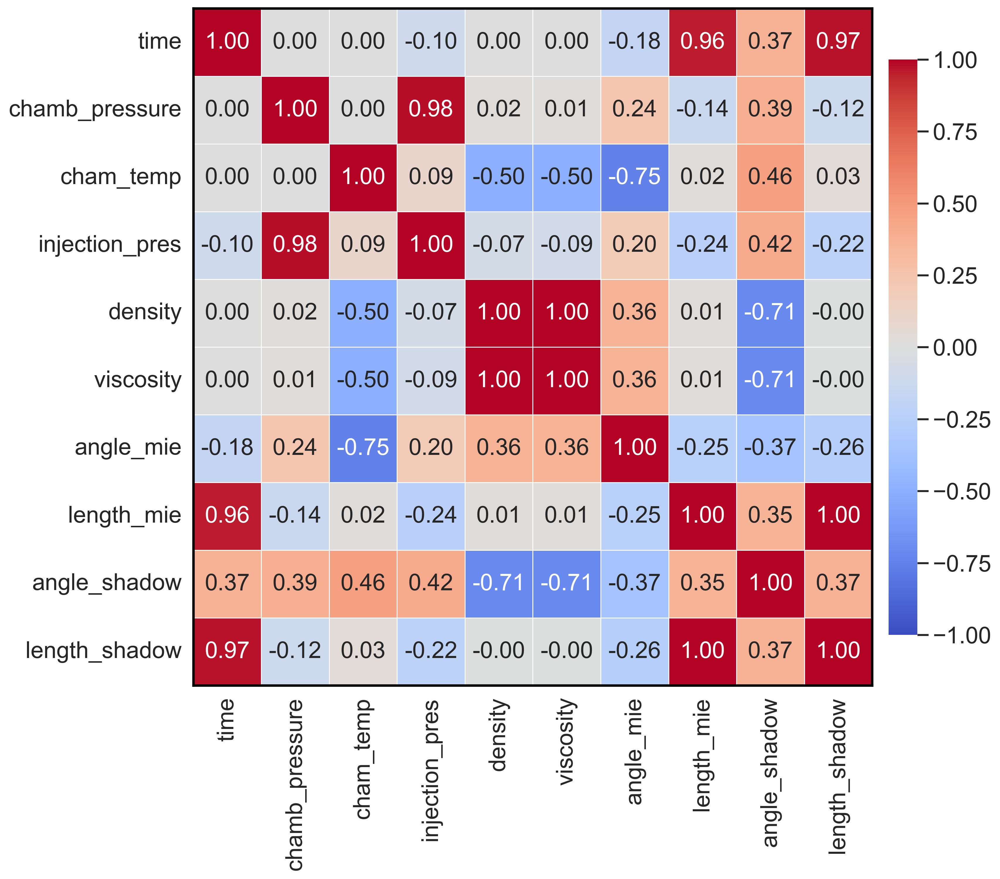

In [7]:
corr_matrix = df[FEATURES + TARGETS].corr()
fig, ax = plt.subplots(figsize=(12, 10))
sns.heatmap(
    corr_matrix,
    ax=ax,
    cmap="coolwarm",
    vmin=-1,
    vmax=1,
    annot=True,
    fmt=".2f",
    annot_kws={"fontsize": FONTSIZE},
    linewidths=0.7,
    cbar_kws={"shrink": 0.85, "pad": 0.02}
)
cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=FONTSIZE, width=1.6, length=9)
for spine in ax.spines.values():
    spine.set_visible(True)
    spine.set_linewidth(2.0)
    spine.set_edgecolor("black")
ax.tick_params(axis="x", labelsize=FONTSIZE, rotation=90)
ax.tick_params(axis="y", labelsize=FONTSIZE, rotation=0)
save_plot(fig, "figure_1_4_correlation_heatmap.png")

**Figure 2.1** Scatter plot linking chamber temperature to the Mie-measured spray angle.
This view emphasizes the thermal sensitivity of the spray cone.

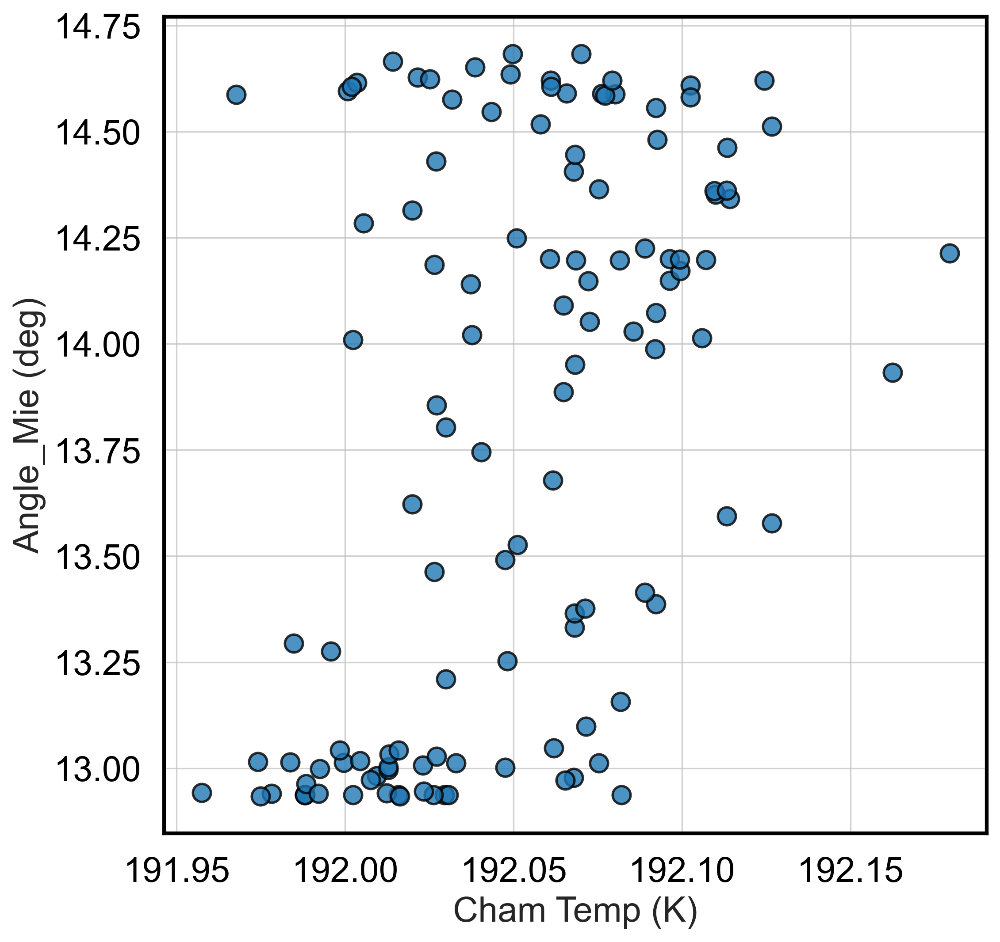

In [8]:
fig, ax = plt.subplots(figsize=(8, 8))
ax.scatter(
    run_trace["cham_temp"],
    run_trace["angle_mie"],
    s=95,
    color="#1f77b4",
    edgecolor="black",
    linewidth=1.3,
    alpha=0.8,
    label="Samples",
 )
ax.set_xlabel("Cham Temp (K)", fontsize=FONTSIZE)
ax.set_ylabel("Angle_Mie (deg)", fontsize=FONTSIZE)
style_axes(ax)
save_plot(fig, "figure_2_1_cham_temp_vs_angle_mie.png")

**Figure 2.2** Scatter plot of mixture density versus the shadowgraph spray angle.
Higher density mixtures correspond to slightly narrower spray fans.

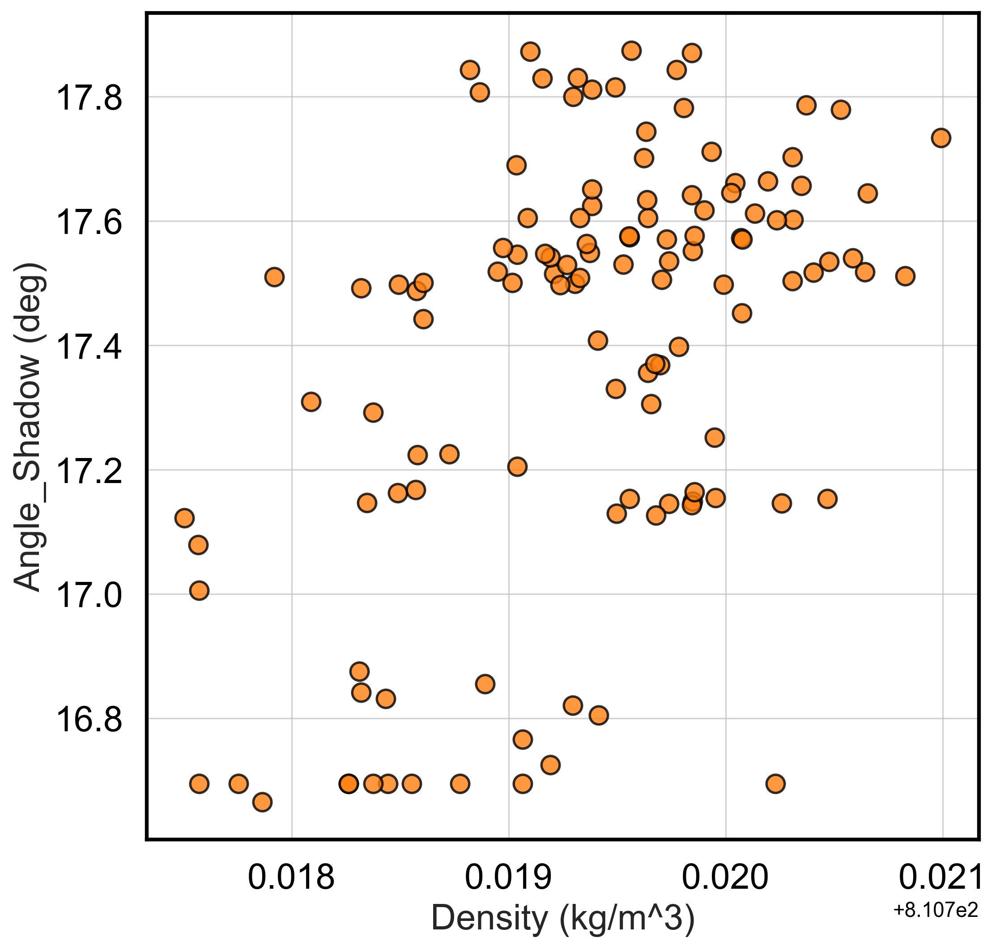

In [9]:
fig, ax = plt.subplots(figsize=(8, 8))
ax.scatter(
    run_trace["density"],
    run_trace["angle_shadow"],
    s=95,
    color="#ff7f0e",
    edgecolor="black",
    linewidth=1.3,
    alpha=0.8,
    label="Samples",
 )
ax.set_xlabel("Density (kg/m^3)", fontsize=FONTSIZE)
ax.set_ylabel("Angle_Shadow (deg)", fontsize=FONTSIZE)
style_axes(ax)
save_plot(fig, "figure_2_2_density_vs_angle_shadow.png")

**Figure 2.3** True versus predicted spray angle (Mie) from the ANN model across the held-out set.
The thick traces demonstrate strong alignment between measured and modeled responses.

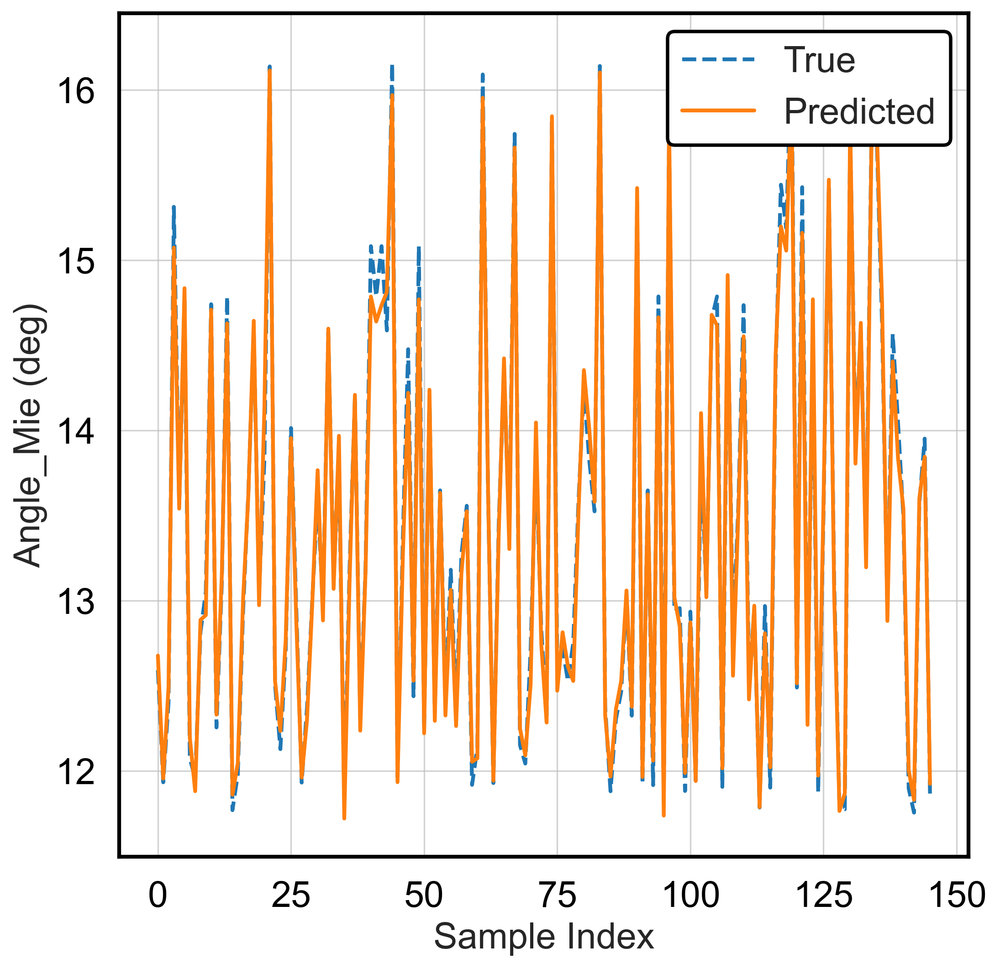

In [10]:
target = "angle_mie"
fig, ax = plt.subplots(figsize=(8, 8))
ax.plot(sample_index, y_test[target].values, label="True", color="#1f77b4", linewidth=2, linestyle="--")
ax.plot(sample_index, np.array(ann_predictions_df[target].values), label="Predicted", color="#ff7f0e", linewidth=2)
ax.set_xlabel("Sample Index", fontsize=FONTSIZE)
ax.set_ylabel("Angle_Mie (deg)", fontsize=FONTSIZE)
style_axes(ax)
legend = ax.legend(loc="upper right", frameon=True, fontsize=FONTSIZE)
style_legend(legend)
save_plot(fig, "figure_2_3_true_vs_pred_angle_mie.png")

**Figure 2.4** True versus predicted shadowgraph spray angle from the ANN model.
The model follows temporal oscillations with minimal lag.

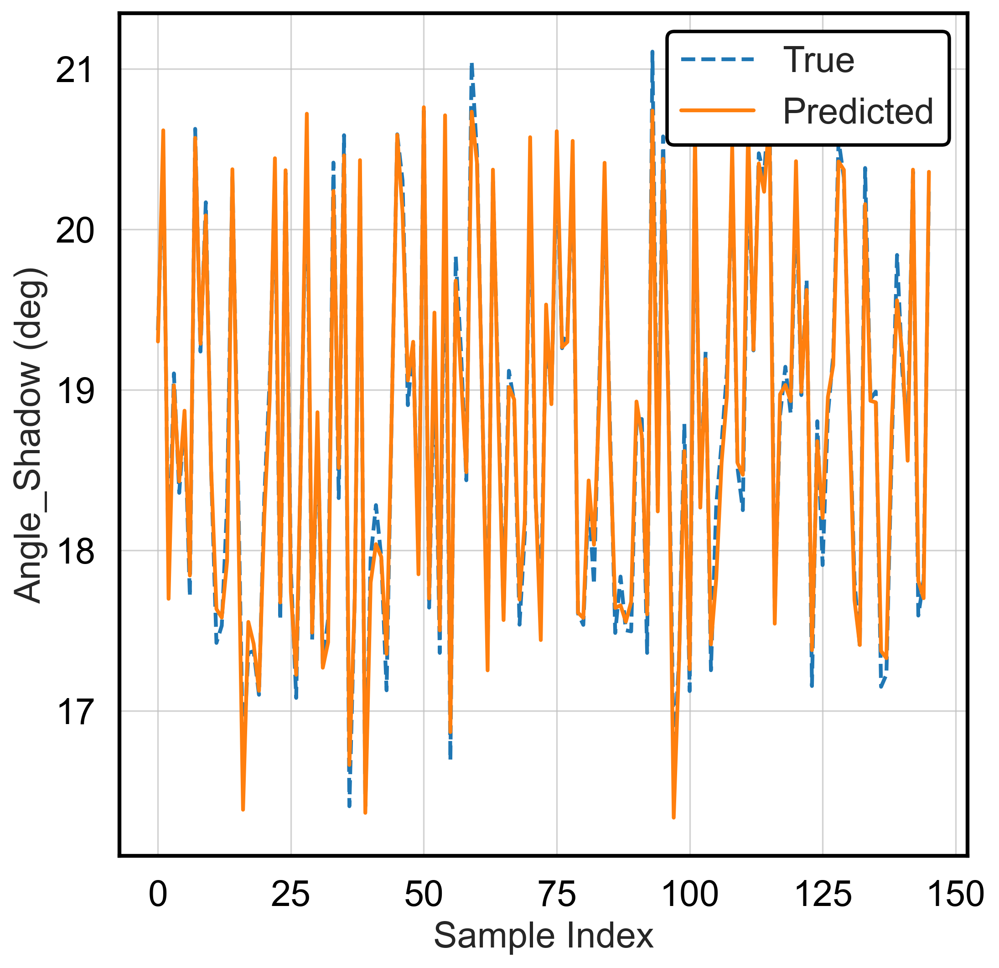

In [11]:
target = "angle_shadow"
fig, ax = plt.subplots(figsize=(8, 8))
ax.plot(sample_index, y_test[target].values, label="True", color="#1f77b4", linewidth=2, linestyle="--")
ax.plot(sample_index, np.array(ann_predictions_df[target].values), label="Predicted", color="#ff7f0e", linewidth=2)
ax.set_xlabel("Sample Index", fontsize=FONTSIZE)
ax.set_ylabel("Angle_Shadow (deg)", fontsize=FONTSIZE)
style_axes(ax)
legend = ax.legend(loc="upper right", frameon=True, fontsize=FONTSIZE)
style_legend(legend)
save_plot(fig, "figure_2_4_true_vs_pred_angle_shadow.png")

**Figure 2.5** True versus predicted Mie spray length from the ANN model.
Predictions reproduce the rapid growth in penetration length with time.

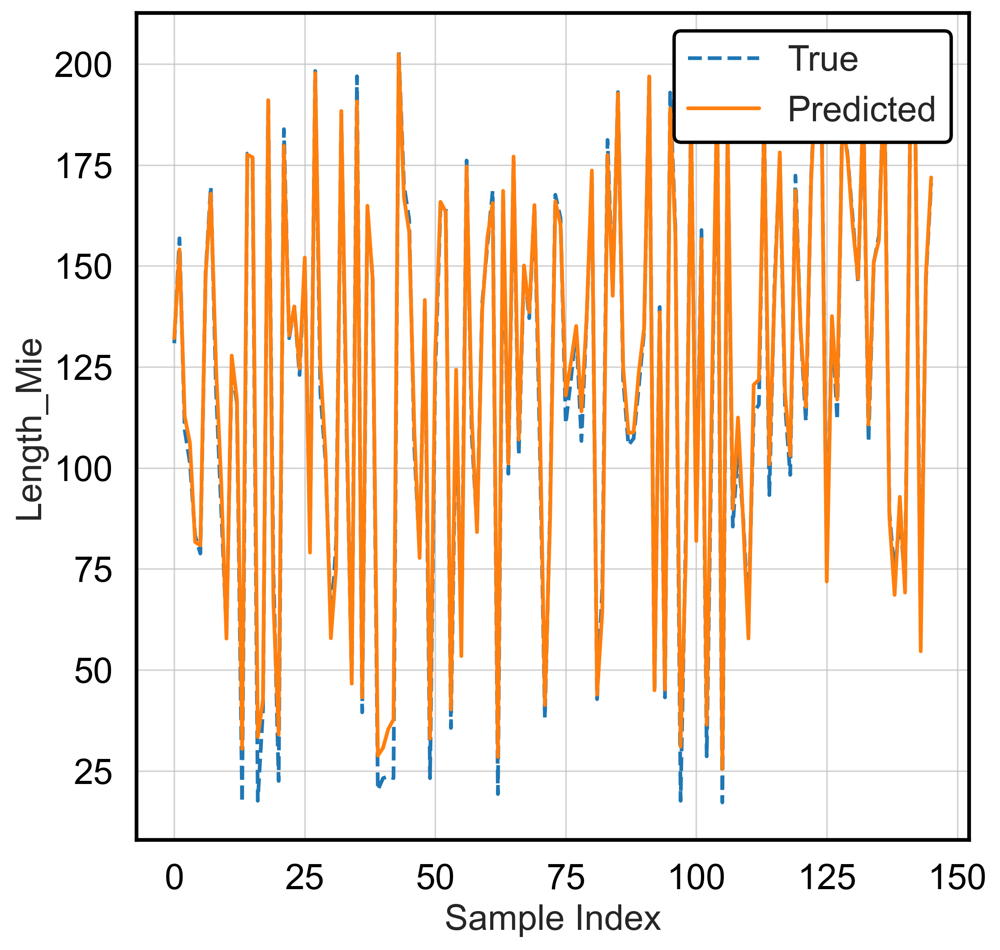

In [12]:
target = "length_mie"
fig, ax = plt.subplots(figsize=(8, 8))
ax.plot(sample_index, y_test[target].values, label="True", color="#1f77b4", linewidth=2, linestyle="--")
ax.plot(sample_index, np.array(ann_predictions_df[target].values), label="Predicted", color="#ff7f0e", linewidth=2)
ax.set_xlabel("Sample Index", fontsize=FONTSIZE)
ax.set_ylabel("Length_Mie", fontsize=FONTSIZE)
style_axes(ax)
legend = ax.legend(loc="upper right", frameon=True, fontsize=FONTSIZE)
style_legend(legend)
save_plot(fig, "figure_2_5_true_vs_pred_length_mie.png")

**Figure 2.6** True versus predicted shadowgraph spray length from the ANN model.
Agreement is maintained even in the peak penetration interval.

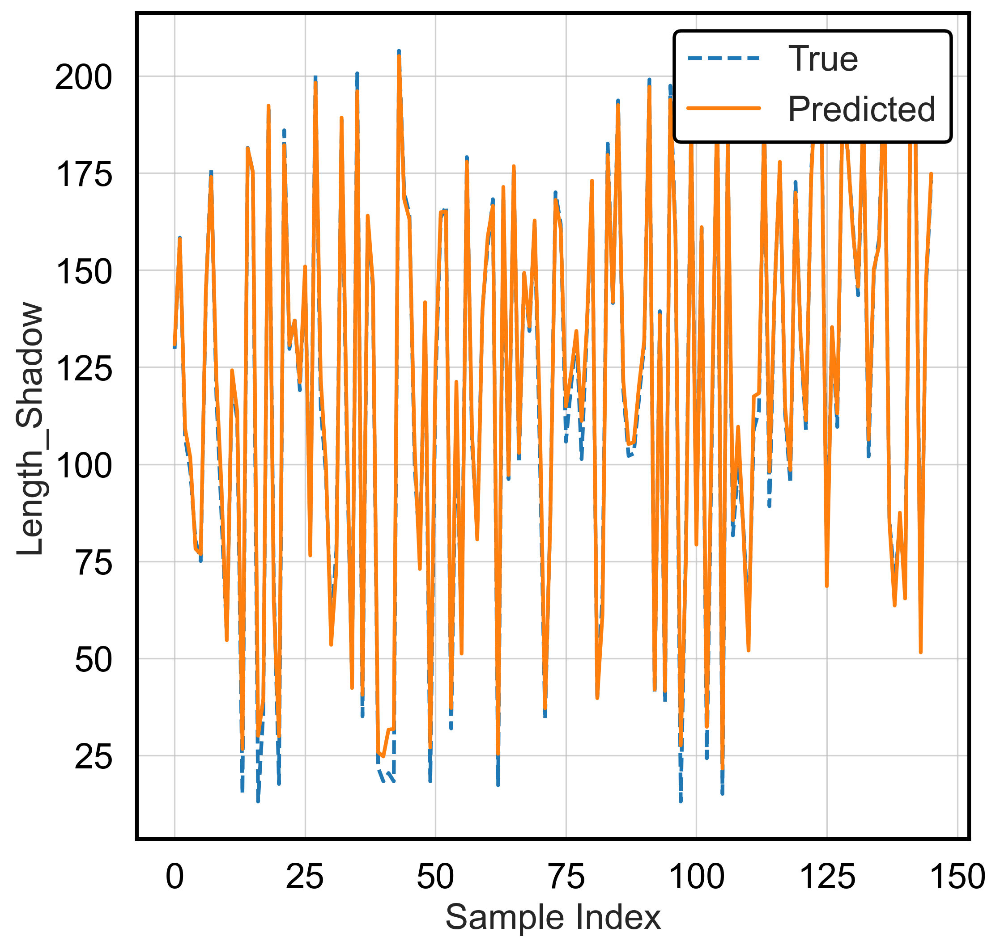

In [13]:
target = "length_shadow"
fig, ax = plt.subplots(figsize=(8, 8))
ax.plot(sample_index, y_test[target].values, label="True", color="#1f77b4", linewidth=2, linestyle="--")
ax.plot(sample_index, np.array(ann_predictions_df[target].values), label="Predicted", color="#ff7f0e", linewidth=2)
ax.set_xlabel("Sample Index", fontsize=FONTSIZE)
ax.set_ylabel("Length_Shadow", fontsize=FONTSIZE)
style_axes(ax)
legend = ax.legend(loc="upper right", frameon=True, fontsize=FONTSIZE)
style_legend(legend)
save_plot(fig, "figure_2_6_true_vs_pred_length_shadow.png")

**Figure 2.7** Parity plot for spray angle (Mie) comparing all classical machine-learning models.
Markers cluster tightly around the diagonal, indicating accurate predictions.

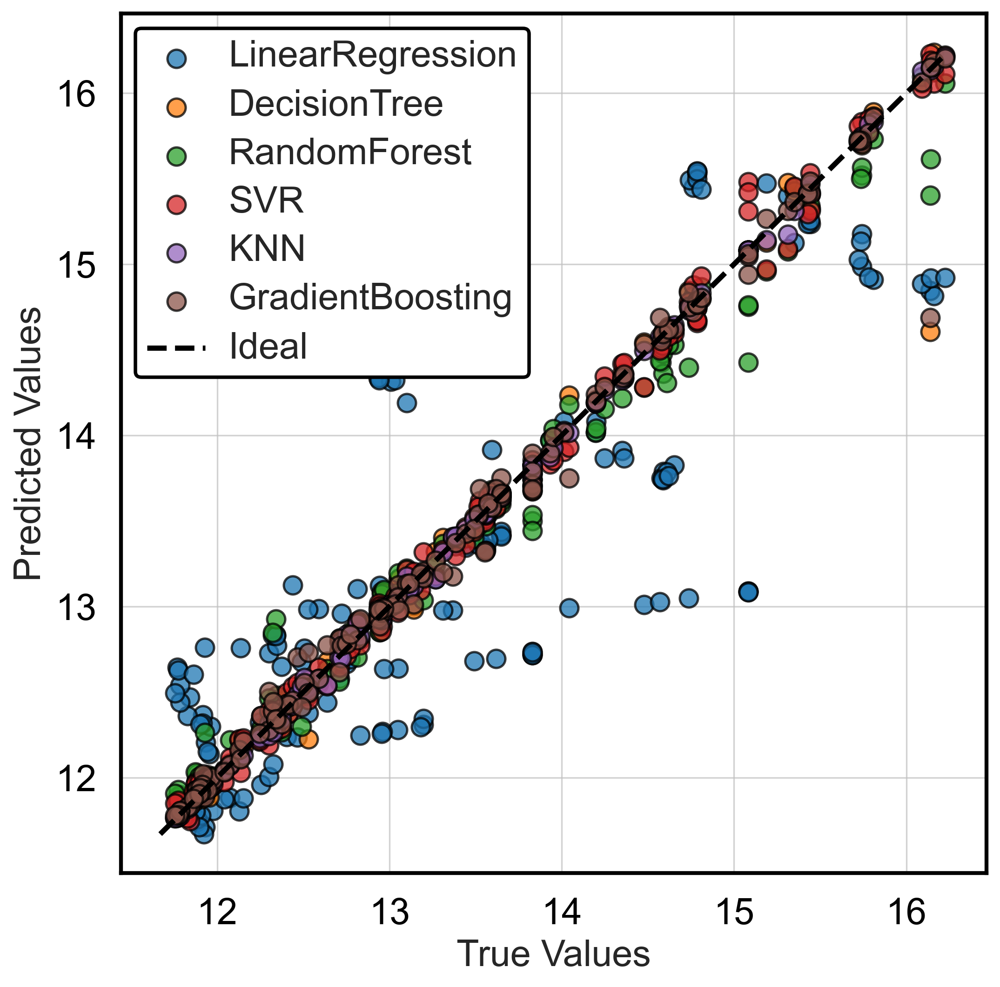

In [6]:
target = "angle_mie"
fig, ax = plt.subplots(figsize=(8, 8))
y_true = y_test[target].values
all_preds = []
for model_name, _ in MODEL_ORDER:
    if model_name not in model_predictions:
        continue
    preds = model_predictions[model_name]["predictions"][target].values
    ax.scatter(
        y_true,
        preds,
        s=88,
        color=MODEL_COLORS[model_name],
        linewidth=1.2,
        alpha=0.75,
        edgecolor="black",
        label=model_name,
    )
    all_preds.append(preds)
if all_preds:
    combined_min = min(min(arr) for arr in [y_true] + all_preds)
    combined_max = max(max(arr) for arr in [y_true] + all_preds)
    diag = np.linspace(combined_min, combined_max, 200)
    ax.plot(diag, diag, color="black", linestyle="--", linewidth=2.7, label="Ideal")
ax.set_xlabel("True Values", fontsize=FONTSIZE)
ax.set_ylabel("Predicted Values", fontsize=FONTSIZE)
style_axes(ax)
legend = ax.legend(loc="upper left", frameon=True, fontsize=FONTSIZE-4)
style_legend(legend)
save_plot(fig, "figure_2_7_parity_angle_mie.png")

**Figure 2.8** Parity plot for shadowgraph spray angle across all classical models.
Slightly wider scatter appears compared with the Mie instrument.

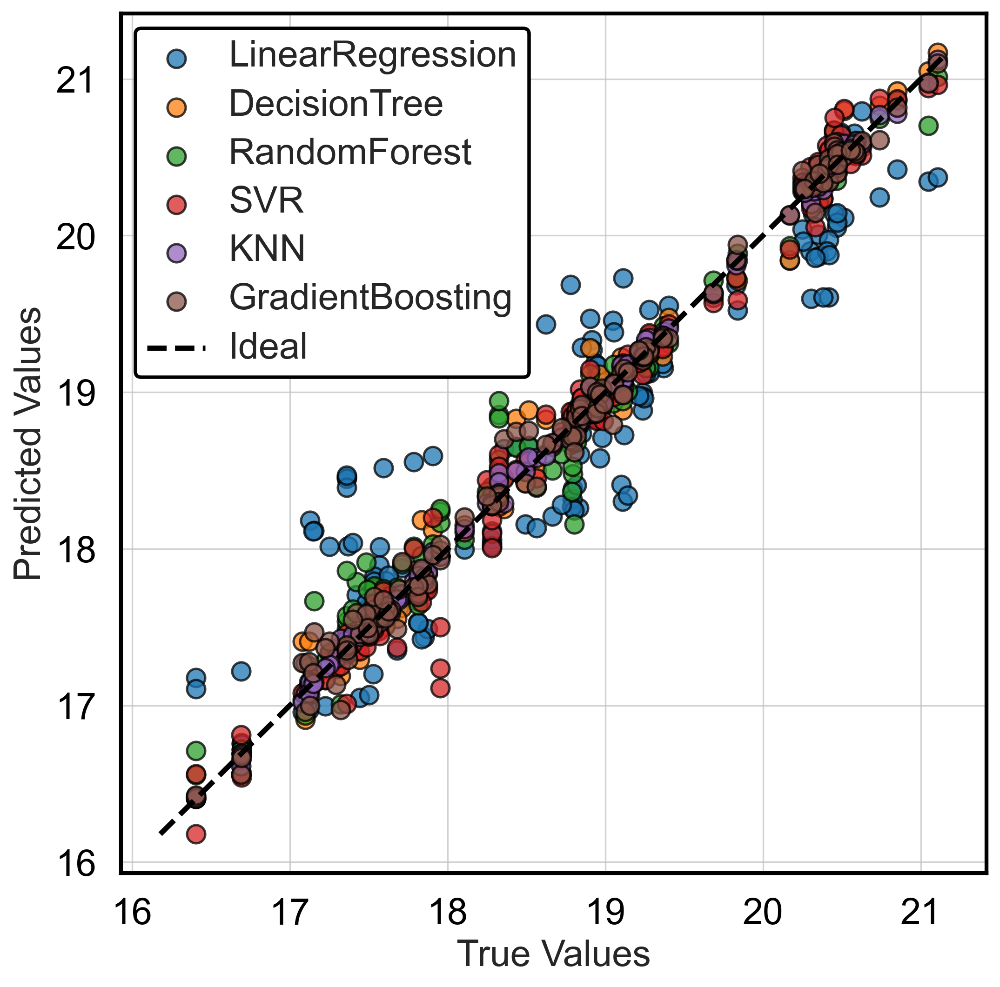

In [7]:
target = "angle_shadow"
fig, ax = plt.subplots(figsize=(8, 8))
y_true = y_test[target].values
all_preds = []
for model_name, _ in MODEL_ORDER:
    if model_name not in model_predictions:
        continue
    preds = model_predictions[model_name]["predictions"][target].values
    ax.scatter(
        y_true,
        preds,
        s=88,
        color=MODEL_COLORS[model_name],
        edgecolor="black",
        linewidth=1.2,
        alpha=0.75,
        label=model_name,
    )
    all_preds.append(preds)
if all_preds:
    combined_min = min(min(arr) for arr in [y_true] + all_preds)
    combined_max = max(max(arr) for arr in [y_true] + all_preds)
    diag = np.linspace(combined_min, combined_max, 200)
    ax.plot(diag, diag, color="black", linestyle="--", linewidth=2.7, label="Ideal")
ax.set_xlabel("True Values", fontsize=FONTSIZE)
ax.set_ylabel("Predicted Values", fontsize=FONTSIZE)
style_axes(ax)
legend = ax.legend(loc="upper left", frameon=True, fontsize=FONTSIZE-4)
style_legend(legend)
save_plot(fig, "figure_2_8_parity_angle_shadow.png")

**Figure 2.9** Parity plot for Mie spray length predictions across all classical models.
Penetration predictions remain tightly bound to the 1:1 line.

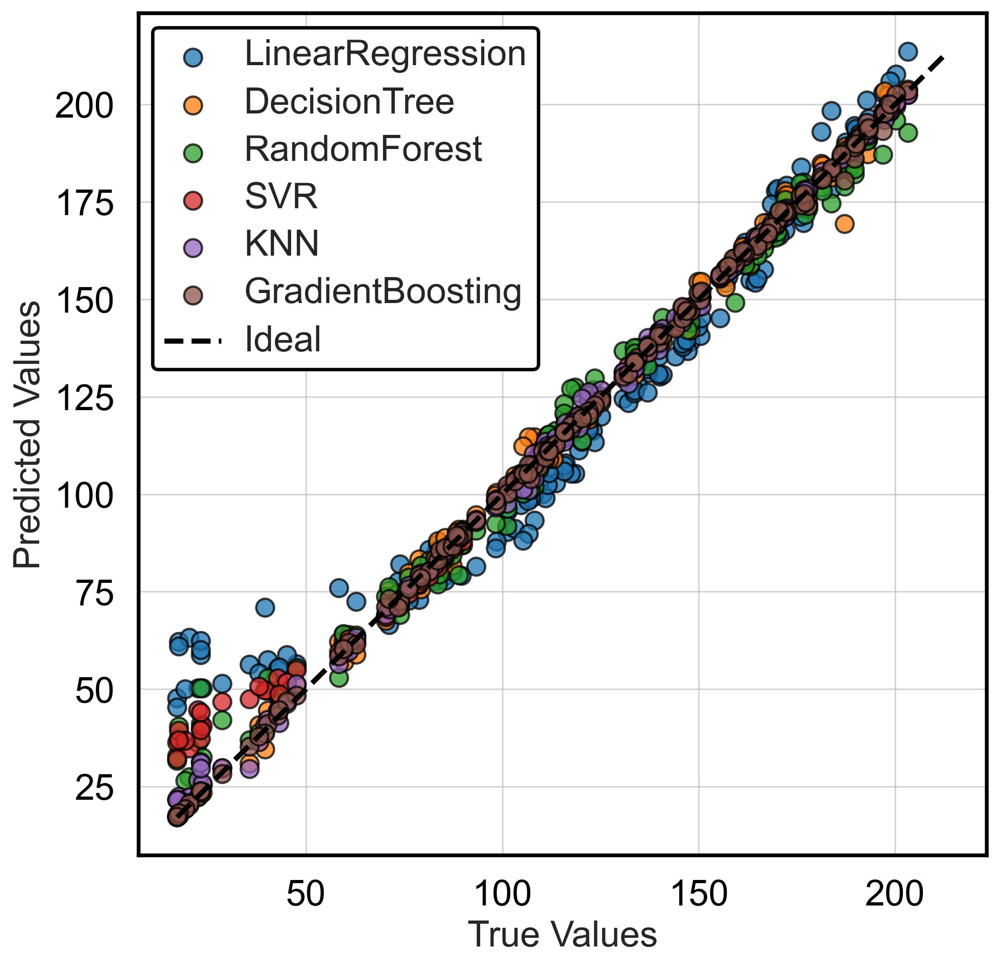

In [8]:
target = "length_mie"
fig, ax = plt.subplots(figsize=(8, 8))
y_true = y_test[target].values
all_preds = []
for model_name, _ in MODEL_ORDER:
    if model_name not in model_predictions:
        continue
    preds = model_predictions[model_name]["predictions"][target].values
    ax.scatter(
        y_true,
        preds,
        s=88,
        color=MODEL_COLORS[model_name],
        edgecolor="black",
        linewidth=1.2,
        alpha=0.75,
        label=model_name,
    )
    all_preds.append(preds)
if all_preds:
    combined_min = min(min(arr) for arr in [y_true] + all_preds)
    combined_max = max(max(arr) for arr in [y_true] + all_preds)
    diag = np.linspace(combined_min, combined_max, 200)
    ax.plot(diag, diag, color="black", linestyle="--", linewidth=2.7, label="Ideal")
ax.set_xlabel("True Values", fontsize=FONTSIZE)
ax.set_ylabel("Predicted Values", fontsize=FONTSIZE)
style_axes(ax)
legend = ax.legend(loc="upper left", frameon=True, fontsize=FONTSIZE-4)
style_legend(legend)
save_plot(fig, "figure_2_9_parity_length_mie.png")

**Figure 2.10** Parity plot for shadowgraph spray length predictions.
Performance remains consistent even for the broader range of lengths.

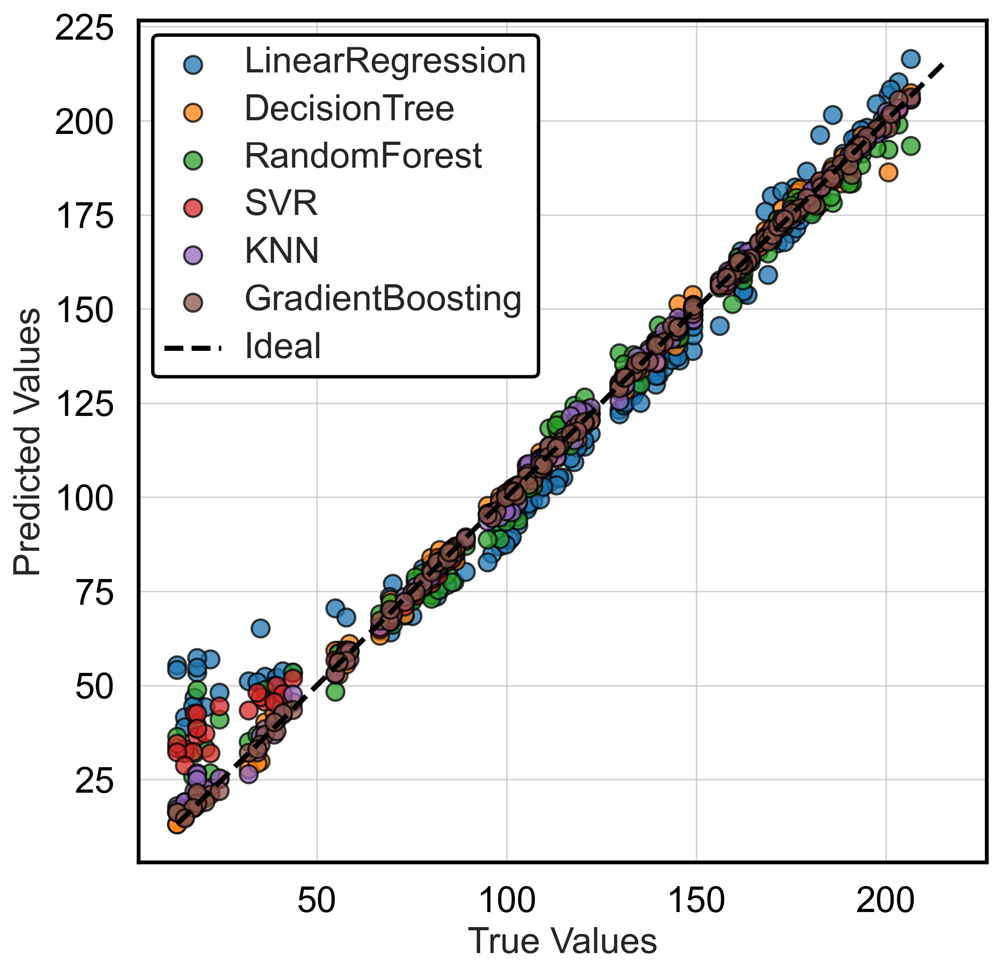

In [9]:
target = "length_shadow"
fig, ax = plt.subplots(figsize=(8, 8))
y_true = y_test[target].values
all_preds = []
for model_name, _ in MODEL_ORDER:
    if model_name not in model_predictions:
        continue
    preds = model_predictions[model_name]["predictions"][target].values
    ax.scatter(
        y_true,
        preds,
        s=88,
        color=MODEL_COLORS[model_name],
        edgecolor="black",
        linewidth=1.2,
        alpha=0.75,
        label=model_name,
    )
    all_preds.append(preds)
if all_preds:
    combined_min = min(min(arr) for arr in [y_true] + all_preds)
    combined_max = max(max(arr) for arr in [y_true] + all_preds)
    diag = np.linspace(combined_min, combined_max, 200)
    ax.plot(diag, diag, color="black", linestyle="--", linewidth=2.7, label="Ideal")
ax.set_xlabel("True Values", fontsize=FONTSIZE)
ax.set_ylabel("Predicted Values", fontsize=FONTSIZE)
style_axes(ax)
legend = ax.legend(loc="upper left", frameon=True, fontsize=FONTSIZE-4)
style_legend(legend)
save_plot(fig, "figure_2_10_parity_length_shadow.png")

**Figure 2.11** KDE residual plots for spray angle (Mie) across all classical models.
Each curve centers tightly around zero, confirming low bias.

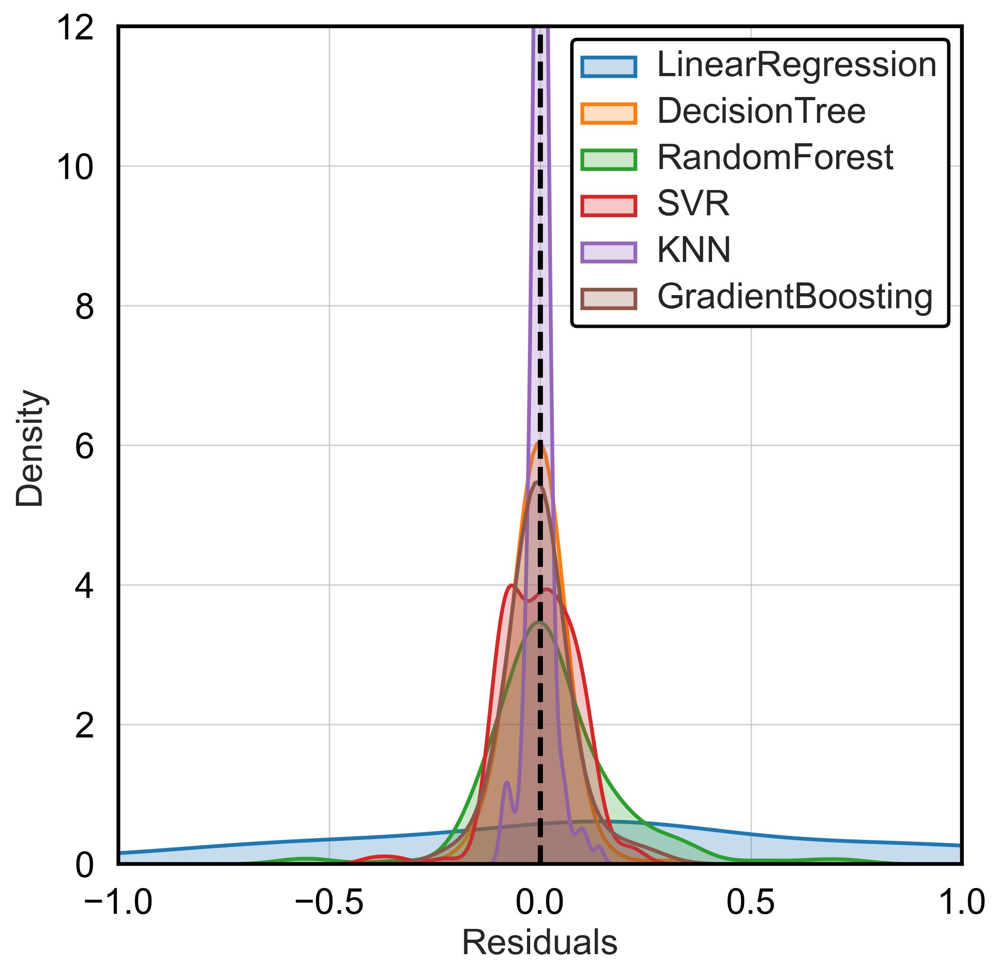

In [30]:
fig, ax = plt.subplots(figsize=(8, 8))
for model_name, _ in MODEL_ORDER:
    if model_name not in angle_mie_residuals:
        continue
    sns.kdeplot(
        angle_mie_residuals[model_name],
        ax=ax,
        color=MODEL_COLORS[model_name],
        linewidth=2,
        label=model_name,
        fill=True,
    )
ax.axvline(0, color="black", linestyle="--", linewidth=2.7)
ax.set_xlabel("Residuals", fontsize=FONTSIZE)
ax.set_ylabel("Density", fontsize=FONTSIZE)
ax.set_xlim(-1, 1)
ax.set_ylim(0, 12)
style_axes(ax)
legend = ax.legend(loc="upper right", frameon=True, ncol=1, fontsize=FONTSIZE-5)
style_legend(legend)
save_plot(fig, "figure_2_11_kde_residuals_angle_mie.png")

**Figure 2.12** Histogram and KDE overlays of spray angle (Mie) residuals for every classical model.
The combined view confirms most residuals sit within ±1 degree.

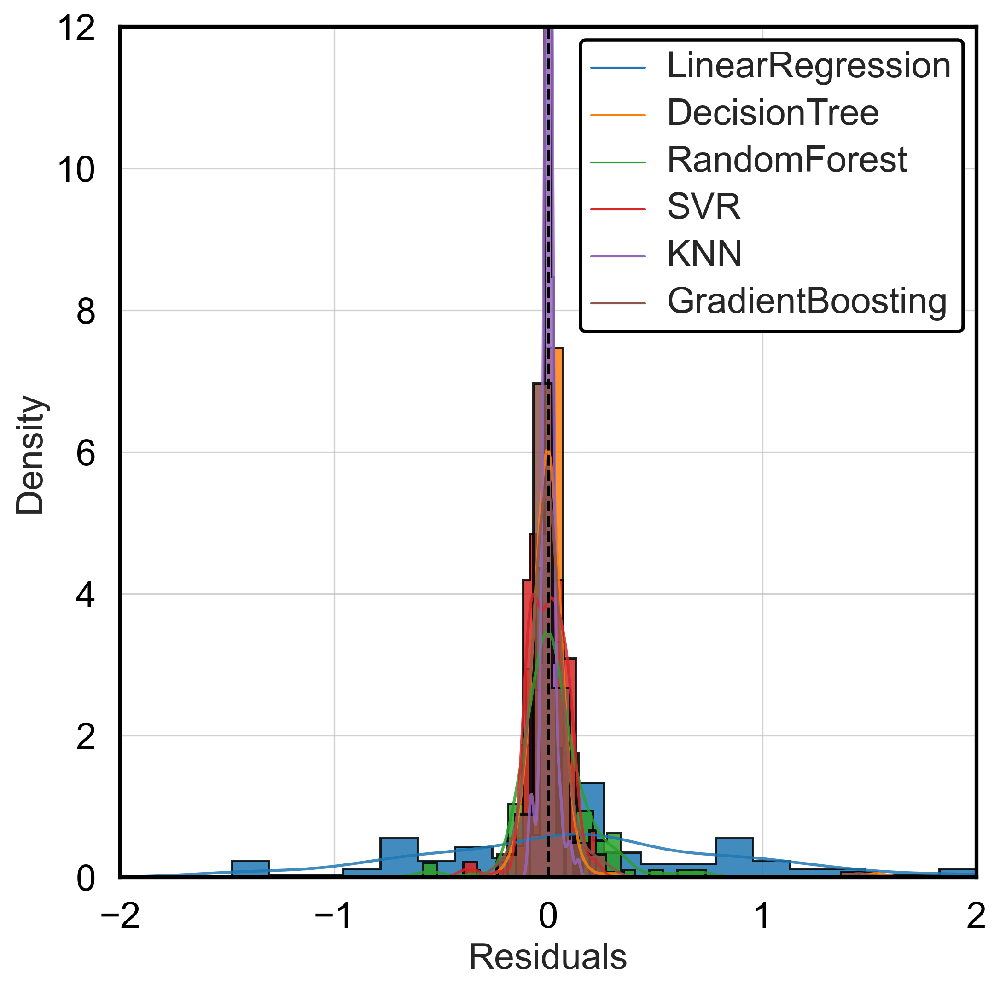

In [31]:
fig, ax = plt.subplots(figsize=(8, 8))
legend_handles = []
for model_name, _ in MODEL_ORDER:
    if model_name not in angle_mie_residuals:
        continue
    ax.hist(
        angle_mie_residuals[model_name],
        bins=20,
        density=True,
        histtype="stepfilled",
        linewidth=1.2,
        color=MODEL_COLORS[model_name],
        alpha=0.85,
        edgecolor="black",
    )
    sns.kdeplot(
        angle_mie_residuals[model_name],
        ax=ax,
        color=MODEL_COLORS[model_name],
        linewidth=1.5,
        fill=False,
        alpha=0.85,
    )
    legend_handles.append(Line2D([0], [0], color=MODEL_COLORS[model_name], linewidth=1, label=model_name))
ax.axvline(0, color="black", linestyle="--", linewidth=1.5)
ax.set_xlabel("Residuals", fontsize=FONTSIZE)
ax.set_ylabel("Density", fontsize=FONTSIZE)
ax.set_xlim(-2, 2)
ax.set_ylim(0, 12)
style_axes(ax)
legend = ax.legend(handles=legend_handles, loc="upper right", frameon=True, fontsize=FONTSIZE-5)
style_legend(legend)
save_plot(fig, "figure_2_12_hist_kde_residuals_angle_mie.png")

**Figure 2.13** Residuals versus predicted values for spray angle (Mie) across all classical models.
No systematic drift with prediction magnitude is observed.

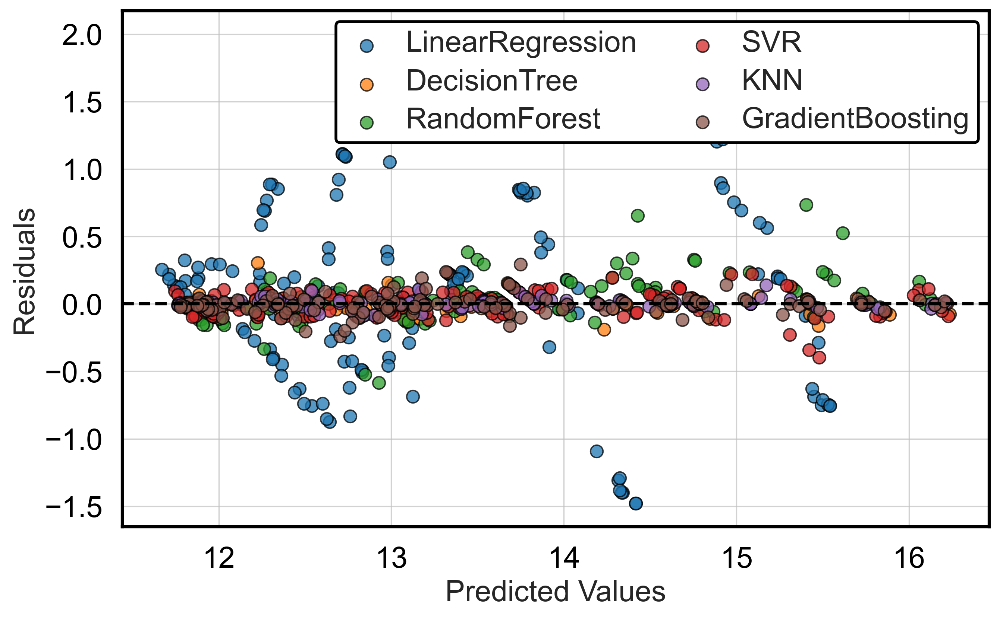

In [32]:
fig, ax = plt.subplots(figsize=(10, 6))
for model_name, _ in MODEL_ORDER:
    if model_name not in angle_mie_pred_values:
        continue
    ax.scatter(
        angle_mie_pred_values[model_name],
        angle_mie_residuals[model_name],
        s=65,
        color=MODEL_COLORS[model_name],
        edgecolor="black",
        linewidth=0.9,
        alpha=0.75,
        label=model_name,
    )
ax.axhline(0, color="black", linestyle="--", linewidth=2.0)
ax.set_xlabel("Predicted Values", fontsize=FONTSIZE)
ax.set_ylabel("Residuals", fontsize=FONTSIZE)
style_axes(ax)
legend = ax.legend(loc="best", frameon=True, ncol=2, fontsize=FONTSIZE-5)
style_legend(legend)
save_plot(fig, "figure_2_13_residuals_vs_predicted_angle_mie.png")

**Figure 2.14** Gradient Boosting feature-importance ranking for spray angle (Mie).
Time and chamber temperature dominate the angle response hierarchy.

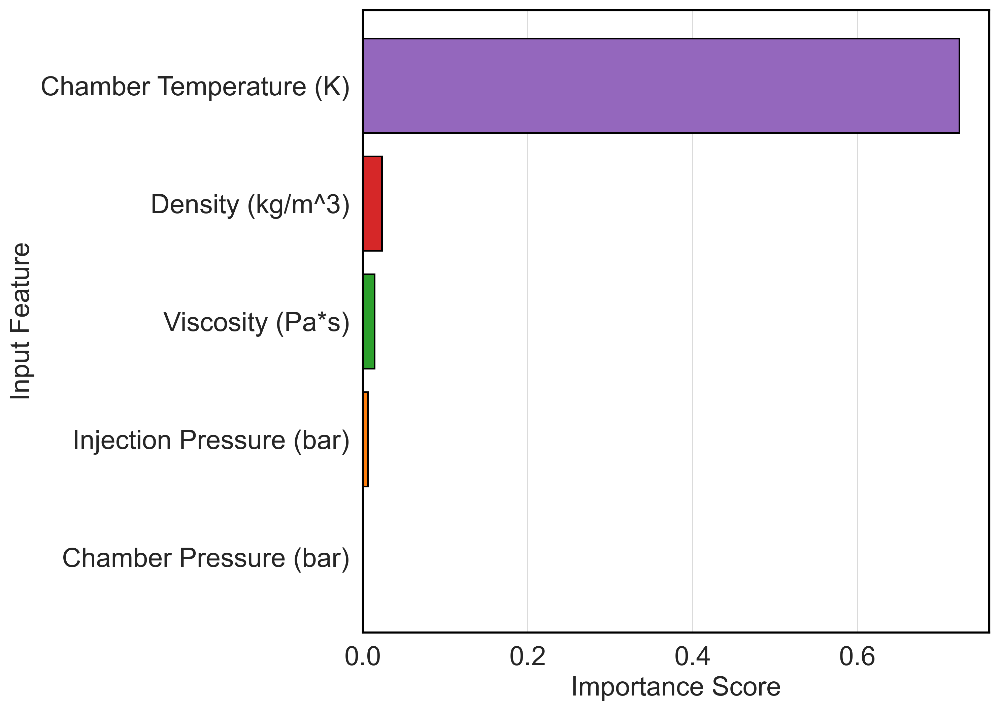

In [21]:
gb_multi = gradient_boosting_model.named_steps["reg"]
angle_index = TARGETS.index("angle_mie")
gb_angle_estimator = gb_multi.estimators_[angle_index]
importance_df = pd.DataFrame({
    "Feature": FEATURES,
    "Importance": gb_angle_estimator.feature_importances_,
}).sort_values("Importance", ascending=True)


# Filter out 'time' feature
importance_df = importance_df[importance_df["Feature"] != "time"]


fig, ax = plt.subplots(figsize=(8, 8))
colors = sns.color_palette("tab10", len(importance_df))
ax.barh(
    [FEATURE_LABELS[f] for f in importance_df["Feature"]],
    importance_df["Importance"],
    color=colors,
    edgecolor="black",
    linewidth=1.2,
)
ax.set_xlabel("Importance Score", fontsize=FONTSIZE)
ax.set_ylabel("Input Feature", fontsize=FONTSIZE)
ax.grid(True, axis="x", color="#c0c0c0", linewidth=0.6)
for spine in ax.spines.values():
    spine.set_visible(True)
    spine.set_linewidth(1.5)
    spine.set_edgecolor("black")
ax.tick_params(axis="both", labelsize=FONTSIZE)
save_plot(fig, "figure_2_14_feature_importance_angle_mie.png")

**Figure 2.15** ANN versus Gradient Boosting comparison for spray angle (Mie).
Both models reside near the identity line with ANN holding a slight R² edge.

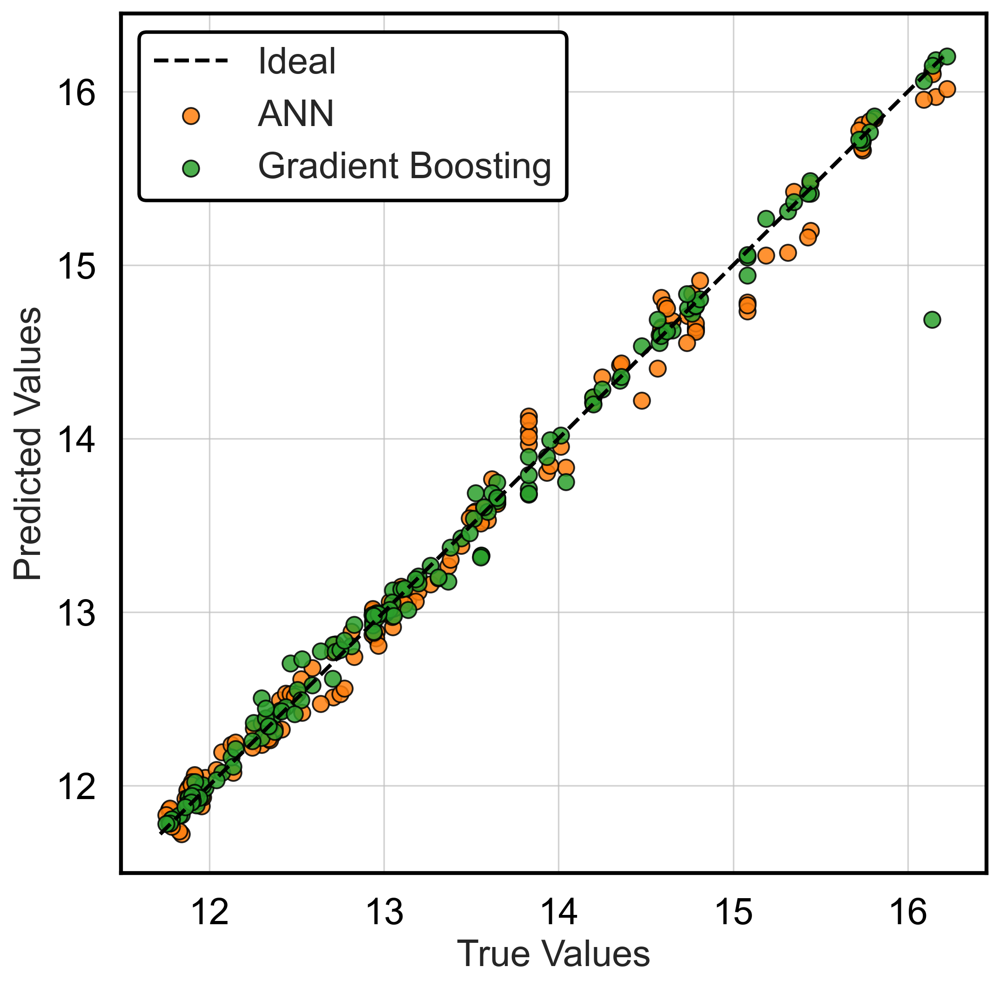

In [22]:
target = "angle_mie"
fig, ax = plt.subplots(figsize=(8, 8))
true_vals = y_test[target].values
ann_vals = ann_predictions_df[target].values
gb_vals = gb_predictions_df[target].values
axis_min = min(np.array(true_vals).min(), np.array(ann_vals).min(), np.array(gb_vals).min())
axis_max = max(np.array(true_vals).max(), np.array(ann_vals).max(), np.array(gb_vals).max())
diag = np.linspace(axis_min, axis_max, 200)
ax.plot(diag, diag, color="black", linestyle="--", linewidth=2.0, label="Ideal")
ax.scatter(
    np.array(true_vals),
    np.array(ann_vals),
    s=70,
    color="#ff7f0e",
    edgecolor="black",
    linewidth=0.9,
    alpha=0.85,
    label="ANN",
)
ax.scatter(
    true_vals,
    gb_vals,
    s=70,
    color="#2ca02c",
    edgecolor="black",
    linewidth=0.9,
    alpha=0.85,
    label="Gradient Boosting",
)
ax.set_xlabel("True Values", fontsize=FONTSIZE)
ax.set_ylabel("Predicted Values", fontsize=FONTSIZE)
style_axes(ax)
legend = ax.legend(loc="upper left", frameon=True, fontsize=FONTSIZE)
style_legend(legend)
save_plot(fig, "figure_2_15_ann_vs_gb_angle_mie.png")

**Figure 2.16** ANN versus Gradient Boosting comparison for shadowgraph spray angle.
The models exhibit comparable skill on the shadowgraph diagnostic.

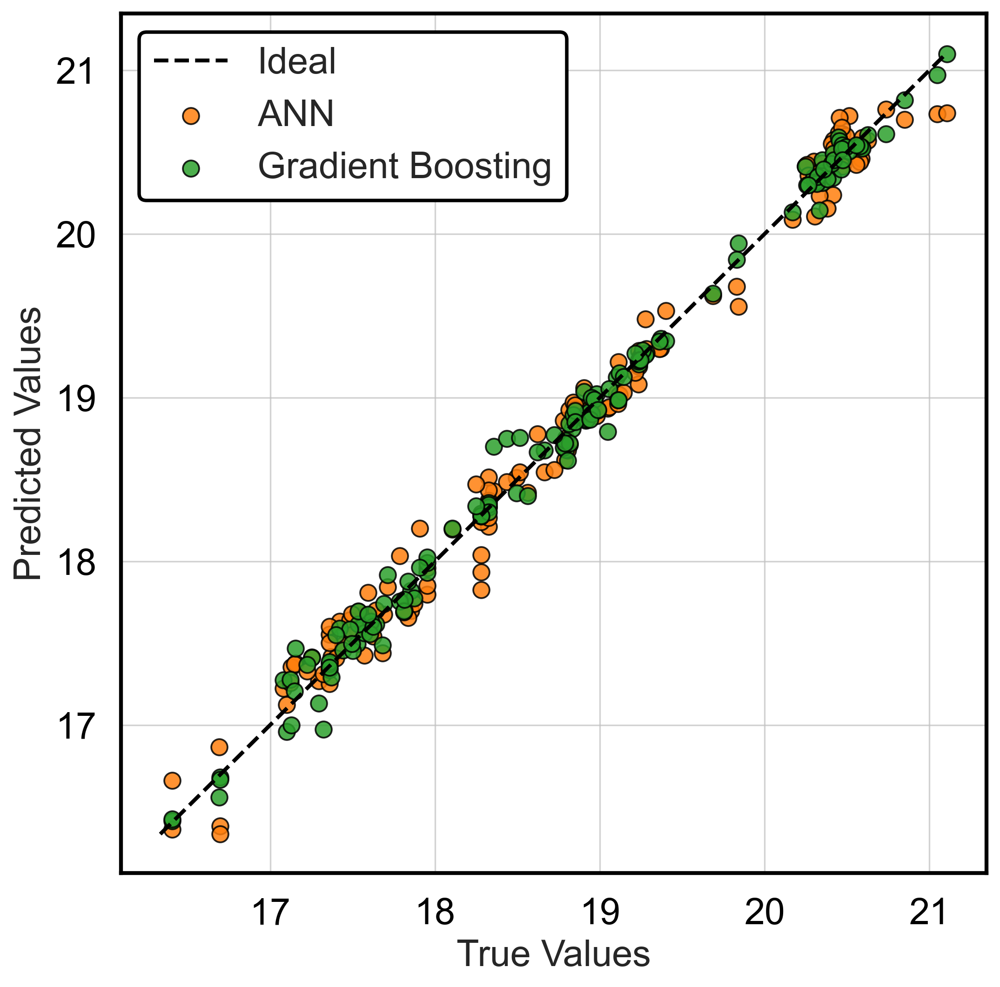

In [23]:
target = "angle_shadow"
fig, ax = plt.subplots(figsize=(8, 8))
true_vals = y_test[target].values
ann_vals = ann_predictions_df[target].values
gb_vals = gb_predictions_df[target].values
axis_min = min(np.array(true_vals).min(), np.array(ann_vals).min(), np.array(gb_vals).min())
axis_max = max(np.array(true_vals).max(), np.array(ann_vals).max(), np.array(gb_vals).max())
diag = np.linspace(axis_min, axis_max, 200)
ax.plot(diag, diag, color="black", linestyle="--", linewidth=2.0, label="Ideal")
ax.scatter(
    np.array(true_vals),
    np.array(ann_vals),
    s=70,
    color="#ff7f0e",
    edgecolor="black",
    linewidth=0.9,
    alpha=0.85,
    label="ANN",
)
ax.scatter(
    true_vals,
    gb_vals,
    s=70,
    color="#2ca02c",
    edgecolor="black",
    linewidth=0.9,
    alpha=0.85,
    label="Gradient Boosting",
)
ax.set_xlabel("True Values", fontsize=FONTSIZE)
ax.set_ylabel("Predicted Values", fontsize=FONTSIZE)
style_axes(ax)
legend = ax.legend(loc="upper left", frameon=True, fontsize=FONTSIZE)
style_legend(legend)
save_plot(fig, "figure_2_16_ann_vs_gb_angle_shadow.png")

**Figure 2.17** ANN versus Gradient Boosting comparison for Mie spray length.
Both models capture the wide spread in penetration metrics.

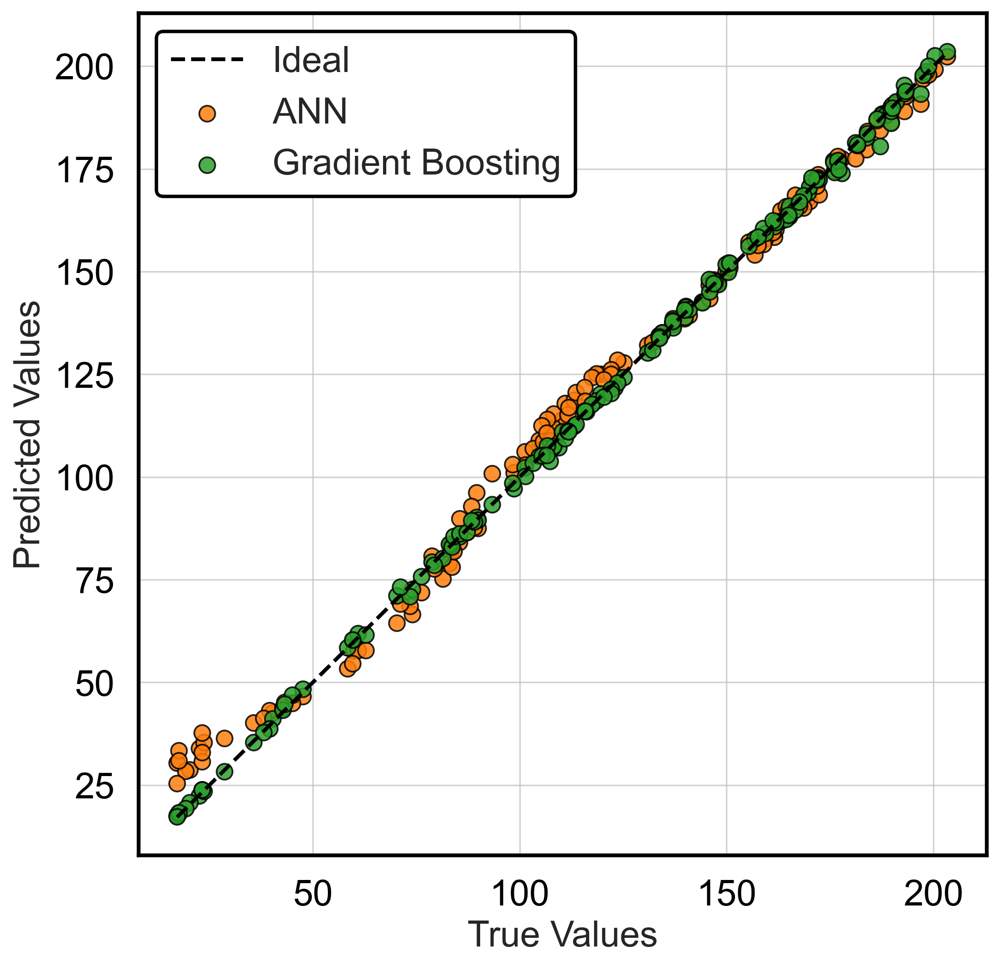

In [24]:
target = "length_mie"
fig, ax = plt.subplots(figsize=(8, 8))
true_vals = y_test[target].values
ann_vals = ann_predictions_df[target].values
gb_vals = gb_predictions_df[target].values
axis_min = min(np.array(true_vals).min(), np.array(ann_vals).min(), np.array(gb_vals).min())
axis_max = max(np.array(true_vals).max(), np.array(ann_vals).max(), np.array(gb_vals).max())

diag = np.linspace(axis_min, axis_max, 200)
ax.plot(diag, diag, color="black", linestyle="--", linewidth=2.0, label="Ideal")
ax.scatter(
    np.array(true_vals),
    np.array(ann_vals),
    s=70,
    color="#ff7f0e",
    edgecolor="black",
    linewidth=0.9,
    alpha=0.85,
    label="ANN",
)
ax.scatter(
    true_vals,
    gb_vals,
    s=70,
    color="#2ca02c",
    edgecolor="black",
    linewidth=0.9,
    alpha=0.85,
    label="Gradient Boosting",
)
ax.set_xlabel("True Values", fontsize=FONTSIZE)
ax.set_ylabel("Predicted Values", fontsize=FONTSIZE)
style_axes(ax)
legend = ax.legend(loc="upper left", frameon=True, fontsize=FONTSIZE)
style_legend(legend)
save_plot(fig, "figure_2_17_ann_vs_gb_length_mie.png")

**Figure 2.18** ANN versus Gradient Boosting comparison for shadowgraph spray length.
The parity surfaces remain tight, underscoring consistent predictions.

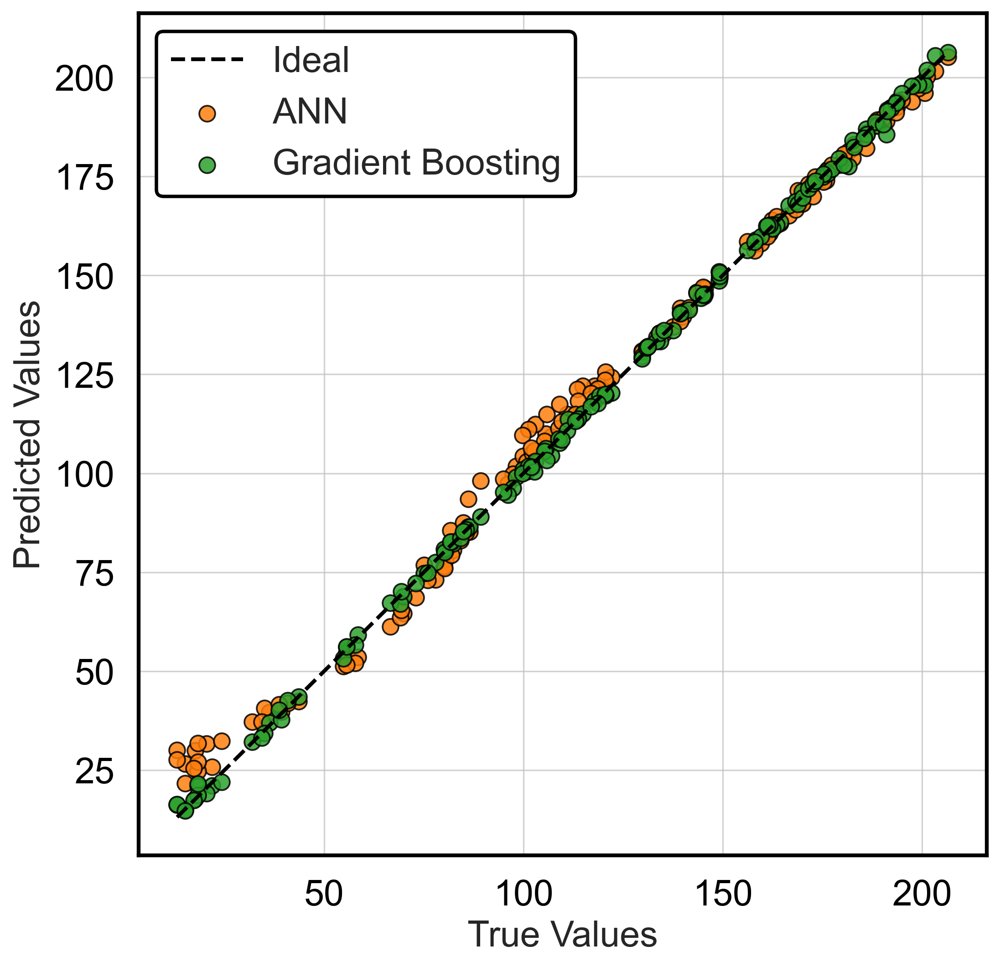

In [25]:
target = "length_shadow"
fig, ax = plt.subplots(figsize=(8, 8))
true_vals = y_test[target].values
ann_vals = ann_predictions_df[target].values
gb_vals = gb_predictions_df[target].values
axis_min = min(np.array(true_vals).min(), np.array(ann_vals).min(), np.array(gb_vals).min())
axis_max = max(np.array(true_vals).max(), np.array(ann_vals).max(), np.array(gb_vals).max())
diag = np.linspace(axis_min, axis_max, 200)
ax.plot(diag, diag, color="black", linestyle="--", linewidth=2.0, label="Ideal")
ax.scatter(
    np.array(true_vals),
    np.array(ann_vals),
    s=70,
    color="#ff7f0e",
    edgecolor="black",
    linewidth=0.9,
    alpha=0.85,
    label="ANN",
)
ax.scatter(
    true_vals,
    gb_vals,
    s=70,
    color="#2ca02c",
    edgecolor="black",
    linewidth=0.9,
    alpha=0.85,
    label="Gradient Boosting",
)
ax.set_xlabel("True Values", fontsize=FONTSIZE)
ax.set_ylabel("Predicted Values", fontsize=FONTSIZE)
style_axes(ax)
legend = ax.legend(loc="upper left", frameon=True, fontsize=FONTSIZE)
style_legend(legend)
save_plot(fig, "figure_2_18_ann_vs_gb_length_shadow.png")

**Figure 2.19** KDE residual distributions for all ANN targets.
Residuals remain centered near zero for both angle and length predictions.

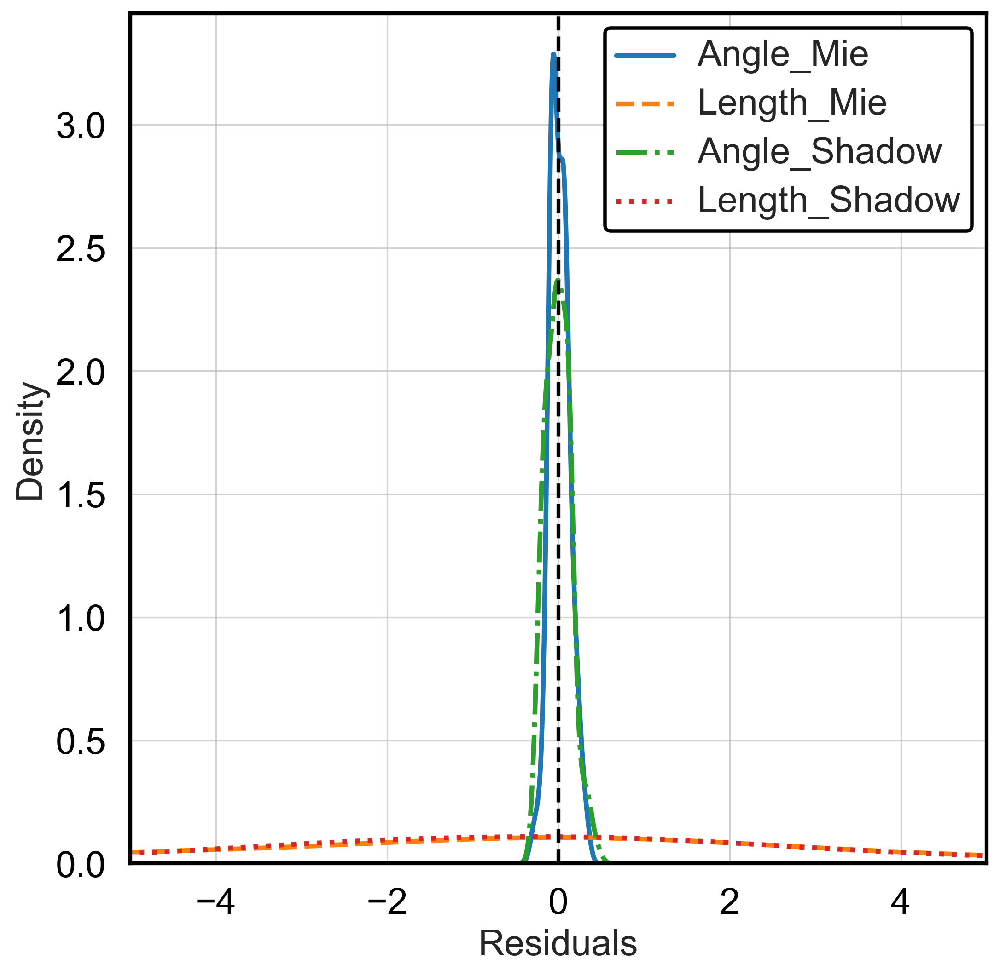

In [38]:
fig, ax = plt.subplots(figsize=(8, 8))
ann_colors = sns.color_palette("tab10", len(TARGETS))
line_styles = ["-", "--", "-.", ":"]  # Different line styles

legend_labels = {
    "angle_mie": "Angle_Mie",
    "length_mie": "Length_Mie",
    "angle_shadow": "Angle_Shadow",
    "length_shadow": "Length_Shadow",
}

for idx, (color, target) in enumerate(zip(ann_colors, TARGETS)):
    sns.kdeplot(
        ann_residuals_df[target].values,
        ax=ax,
        color=color,
        linewidth=2.5,
        label=legend_labels[target],
        fill=False,
        linestyle=line_styles[idx % len(line_styles)],
    )
ax.axvline(0, color="black", linestyle="--", linewidth=2.0)
ax.set_xlabel("Residuals", fontsize=FONTSIZE)
ax.set_ylabel("Density", fontsize=FONTSIZE)
ax.set_xlim(-5, 5)
style_axes(ax)
legend = ax.legend(loc="upper right", frameon=True, ncol=1, fontsize=FONTSIZE-4)
style_legend(legend)
save_plot(fig, "figure_2_19_ann_residuals_kde.png")